# **Team H NLP ⚡Elemetrica LLC Business Model**

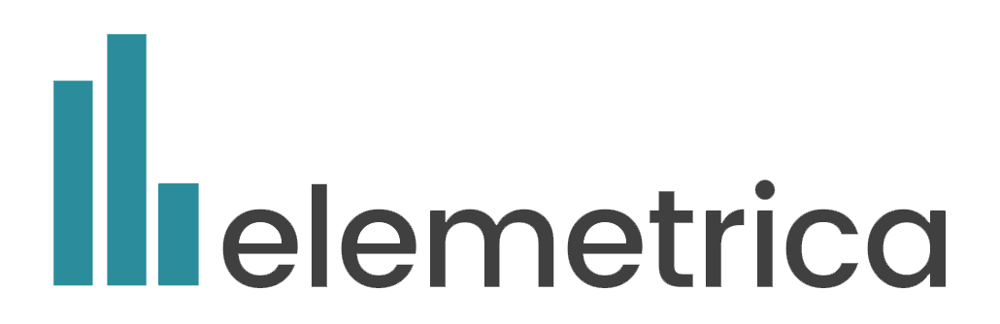

#### Francisco Baiz, Guillermo Hopkins, Juan Garcia Quereda, Magdalena Emilia Brzegowa, Maria Aguilera, Miguel Ricardo Hopkins

# 1. Data Collection

In [109]:
import pandas as pd
from nltk.stem import *
from nltk.corpus import stopwords
import nltk
import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from nltk.tokenize import WhitespaceTokenizer
from sklearn.naive_bayes import MultinomialNB
import matplotlib.pyplot as plt
from sklearn.model_selection import ShuffleSplit
import time
import sklearn
import warnings
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, matthews_corrcoef, cohen_kappa_score
import pickle

In [2]:
df = pd.read_excel('Catalogo.xlsx')
df.head()

,Product Code,Product Description,Base Unit,Weight Unit,Code EAN/UPC,Maker Code,Maker Name,Maker Reference,Code N1,Description N1,Code N2,Description N2,Code N3,Description N3,Code N4,Description N4,Catalog Code
0,10016416,Cemento Holcim Fuerte Tipo GU 50Kg - GU,SAC,1000.0,10016416,9EC01EC83,Holcim Ecuador S.A.,NaN,TC,TRD ESTRUCTURA,T39,TRD CEMENTICIOS,TK8,TRD CEMENTICIOS BÁSICOS,266.0,TRD CEMENTO GRIS,TCT39TK8266
1,10016417,Cemento Holcim Fuerte Tipo GU 50Kg - LT,SAC,1000.0,10016417,9EC01EC83,Holcim Ecuador S.A.,NaN,TC,TRD ESTRUCTURA,T39,TRD CEMENTICIOS,TK8,TRD CEMENTICIOS BÁSICOS,266.0,TRD CEMENTO GRIS,TCT39TK8266
2,10016459,PIEDRA (0 - 150) PIF,T,1000.0,10016459,9EC01EC83,Holcim Ecuador S.A.,NaN,TC,TRD ESTRUCTURA,T40,TRD AGREGADOS,TK7,TRD GRAVAS,446.0,TRD FINOS,TCT40TK7446
3,10016488,PIEDRA HOMOGENIZADA #57 (5 - 25 mm) PIF,T,1000.0,10016488,9EC01EC83,Holcim Ecuador S.A.,NaN,TC,TRD ESTRUCTURA,T40,TRD AGREGADOS,TK7,TRD GRAVAS,446.0,TRD FINOS,TCT40TK7446
4,10016500,PIEDRA # 67 (5 - 19 mm) PIF,T,1000.0,10016500,9EC01EC83,Holcim Ecuador S.A.,NaN,TC,TRD ESTRUCTURA,T40,TRD AGREGADOS,TK7,TRD GRAVAS,446.0,TRD FINOS,TCT40TK7446


# 2. Data Cleaning and Feature Engineering

In [3]:
df.shape

(8186, 17)

In [4]:
df['Description N1'].nunique()

5

In [5]:
df['Description N2'].nunique()

34

In [6]:
df['Description N3'].nunique()

113

In [7]:
df['Description N4'].nunique()

324

In [8]:
df.isna().sum()

Product Code              0
Product Description       0
Base Unit                14
Weight Unit               0
Code EAN/UPC              0
Maker Code                1
Maker Name                1
Maker Reference        8186
Code N1                   1
Description N1            1
Code N2                   1
Description N2            1
Code N3                   1
Description N3            1
Code N4                   1
Description N4            1
Catalog Code              1
dtype: int64

In [9]:
df = df.drop(index=df[df.duplicated(['Product Description'])].index) 

We are going to concatenate the first three descriptions, apply a label coding and train the model with the Product Description to predict those labels.

In [10]:
df['Final_Category'] = df['Description N1'].str.cat(df[['Description N2', 'Description N3']].values,sep=' - ')

In [11]:
df['Final_Category'].head()

0    TRD ESTRUCTURA - TRD CEMENTICIOS - TRD CEMENTI...
1    TRD ESTRUCTURA - TRD CEMENTICIOS - TRD CEMENTI...
2          TRD ESTRUCTURA - TRD AGREGADOS - TRD GRAVAS
3          TRD ESTRUCTURA - TRD AGREGADOS - TRD GRAVAS
4          TRD ESTRUCTURA - TRD AGREGADOS - TRD GRAVAS
Name: Final_Category, dtype: object

In [12]:
df['Final_Category'].nunique()

122

In [13]:
final_categories_counts = df['Final_Category'].value_counts().sort_values(ascending=True)

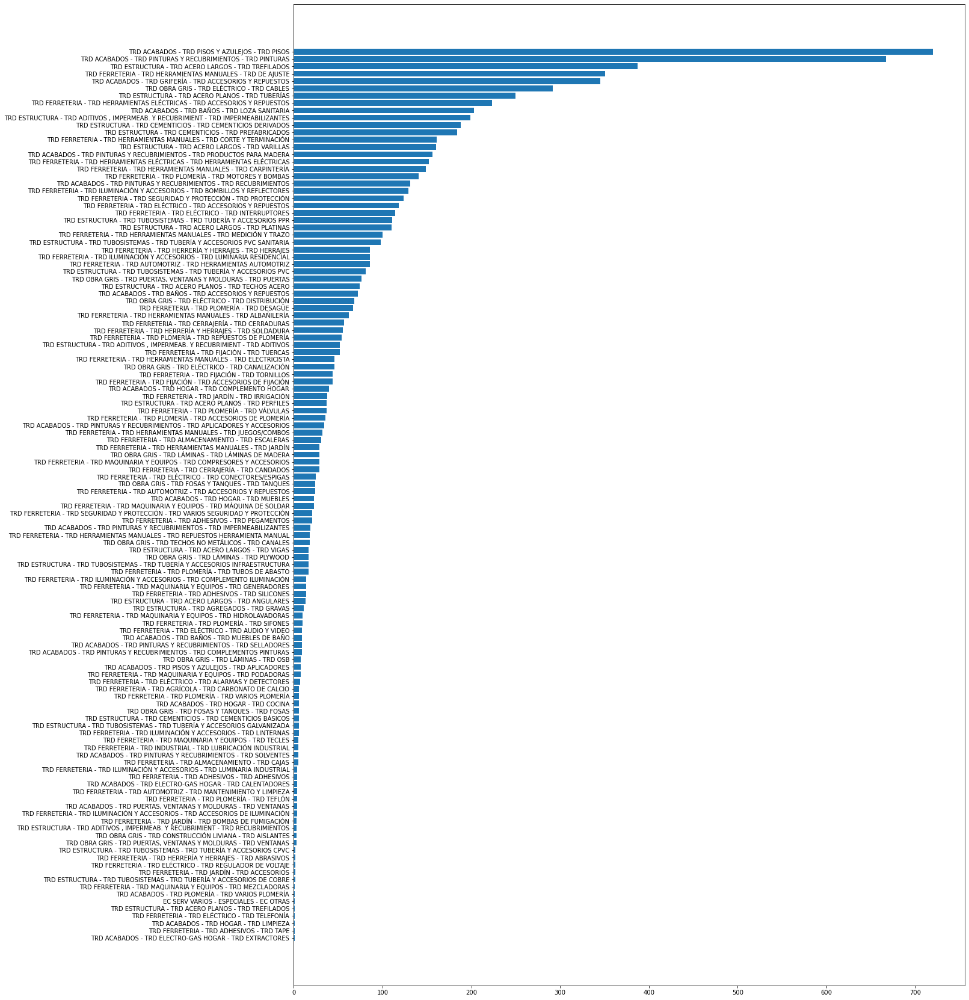

In [14]:
plt.figure(figsize=(20,30))
plt.barh(final_categories_counts.index, final_categories_counts)
plt.xlabel=None

There is a disbalance in the categories

In [15]:
final_categories_counts.head(30)

TRD ACABADOS - TRD ELECTRO-GAS HOGAR - TRD EXTRACTORES                            1
TRD FERRETERIA - TRD ADHESIVOS - TRD TAPE                                         1
TRD ACABADOS - TRD HOGAR - TRD LIMPIEZA                                           1
TRD FERRETERIA - TRD ELÉCTRICO - TRD TELEFONÍA                                    1
TRD ESTRUCTURA - TRD ACERO PLANOS - TRD TREFILADOS                                1
EC SERV VARIOS - ESPECIALES - EC OTRAS                                            1
TRD ACABADOS - TRD PLOMERÍA - TRD VARIOS PLOMERÍA                                 1
TRD FERRETERIA - TRD MAQUINARIA Y EQUIPOS - TRD MEZCLADORAS                       1
TRD ESTRUCTURA - TRD TUBOSISTEMAS - TRD TUBERÍA Y ACCESORIOS DE COBRE             2
TRD FERRETERIA - TRD JARDÍN - TRD ACCESORIOS                                      2
TRD FERRETERIA - TRD ELÉCTRICO - TRD REGULADOR DE VOLTAJE                         2
TRD FERRETERIA - TRD HERRERÍA Y HERRAJES - TRD ABRASIVOS                    

We group the categories that have 5 or less descriptions in a new category called Other.

In [16]:
small_count_categories = final_categories_counts[final_categories_counts<=5].index

In [17]:
len(small_count_categories)

28

We group 28 categories together.

In [18]:
df['Final_Category'].replace(to_replace=small_count_categories, value='Other', inplace=True)

In [19]:
df['codes'] = df['Final_Category'].astype('category').cat.codes
df['codes'].nunique()

96

Finally, we are going to predict 96 categories.

We built a dictionary with the codes and the corresponding category.

In [20]:
code_dictionary = dict(set(list(zip(df['codes'], df['Final_Category']))))

In [21]:
X = df['Product Description']
y = df['codes']

In [22]:
tokenizer = WhitespaceTokenizer()

Let us take a look at the most frequently used word in the reviews

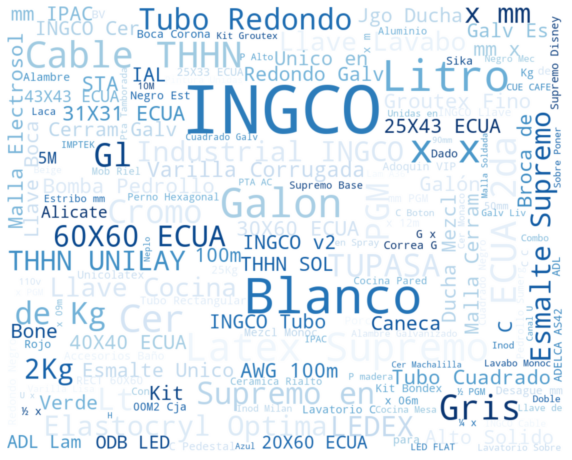

In [127]:
from wordcloud import WordCloud
word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap = 'Blues', 
                       margin = 0,
                       max_words = 183,  
                       max_font_size = 120, min_font_size = 15,  
                       background_color = "white").generate(" ".join(X_train))

plt.figure(figsize = (10, 15))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

We are going to visualize the most common words in each category to have a better understanding of the structure of the categories and the processing steps we need to follow.

In [23]:
def plot_most_common_features(text_col, target_col, n_features=50):
    from matplotlib import interactive

    df = pd.DataFrame({"text": text_col, "CLASS": target_col})
    grouped = df.groupby(["CLASS"]).apply(lambda x: x["text"].sum())
    grouped_df = pd.DataFrame({"CLASS": grouped.index, "text": grouped.values})

    from nltk.tokenize import WhitespaceTokenizer
    tokenizer = WhitespaceTokenizer()

    for ii, text in enumerate(grouped_df.text):
        pd.DataFrame(tokenizer.tokenize(text)).apply(pd.value_counts).head(n_features).plot(kind="bar", cmap=plt.cm.seismic, figsize=(20,5))
        plt.title(grouped_df.CLASS[ii], fontsize=20)
        plt.xticks(fontsize=15)
        plt.legend([])
        interactive(True)
        plt.show()

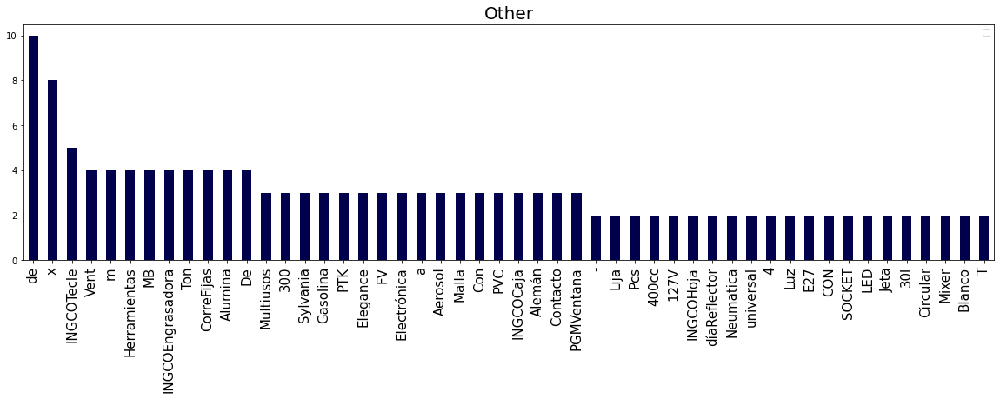

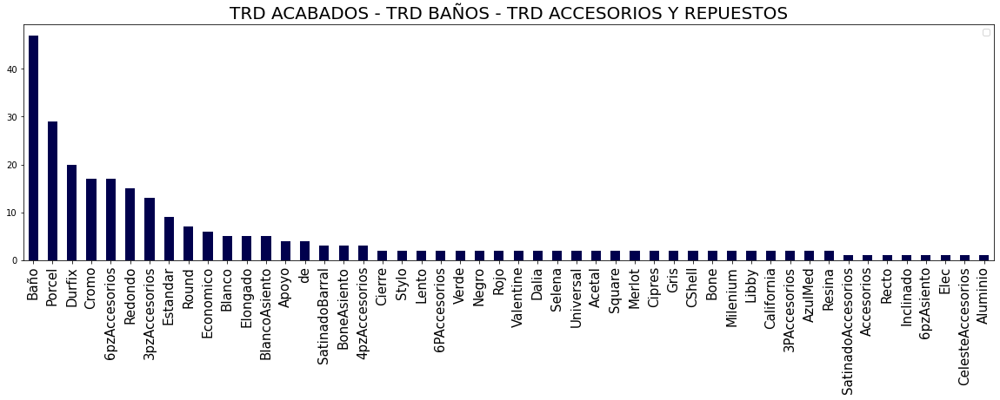

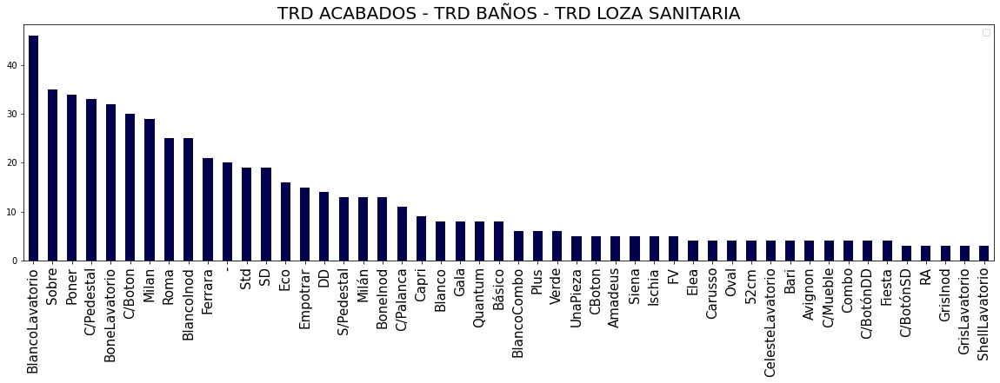

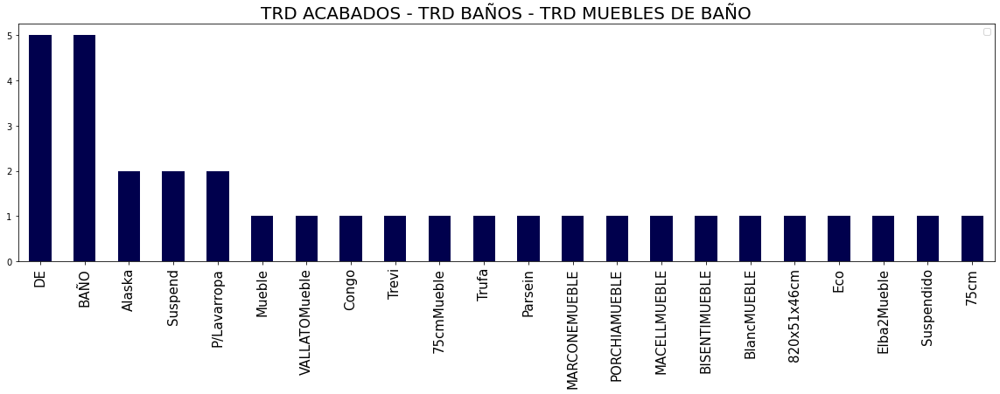

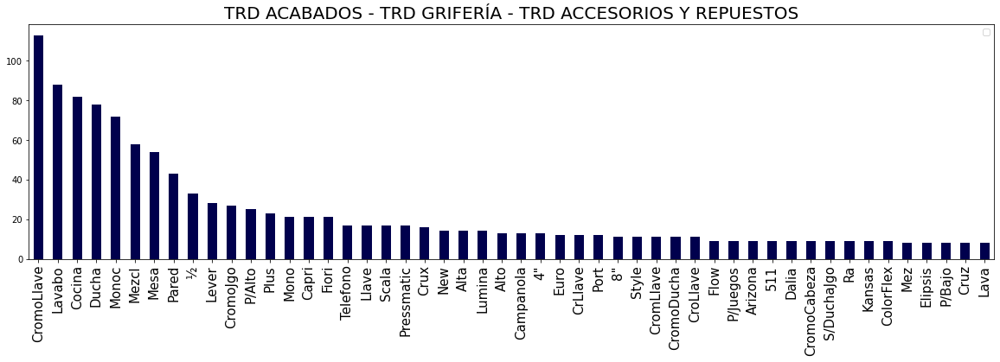

...

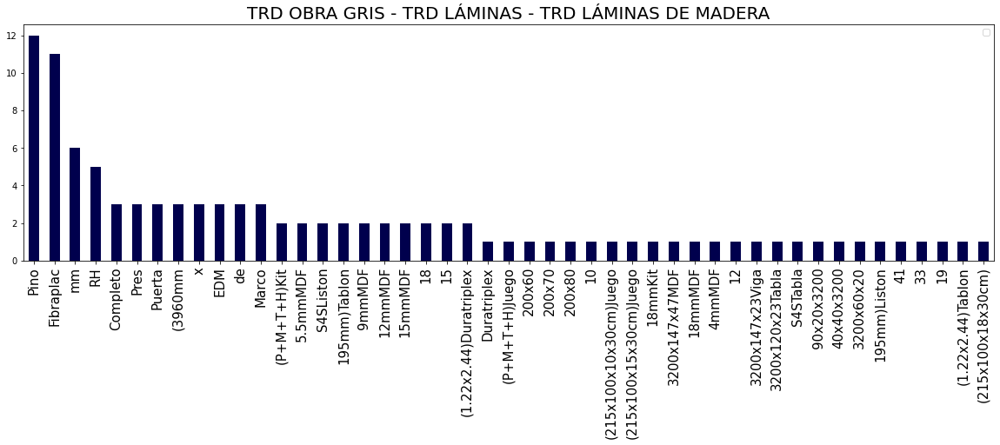

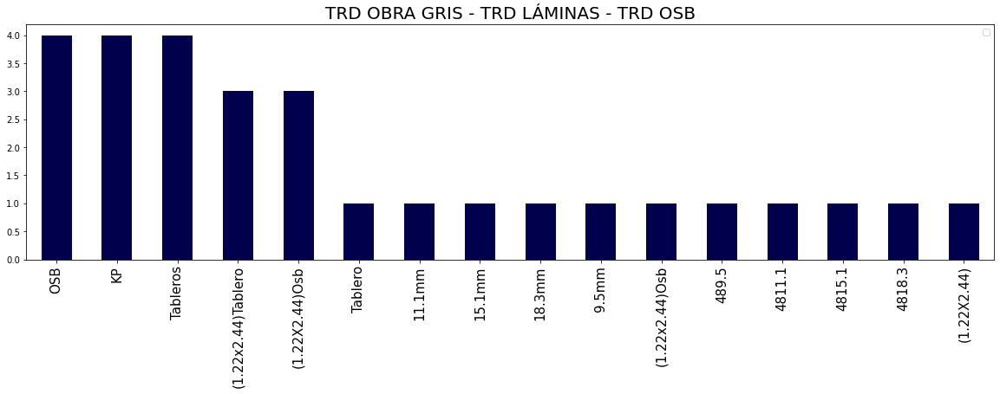

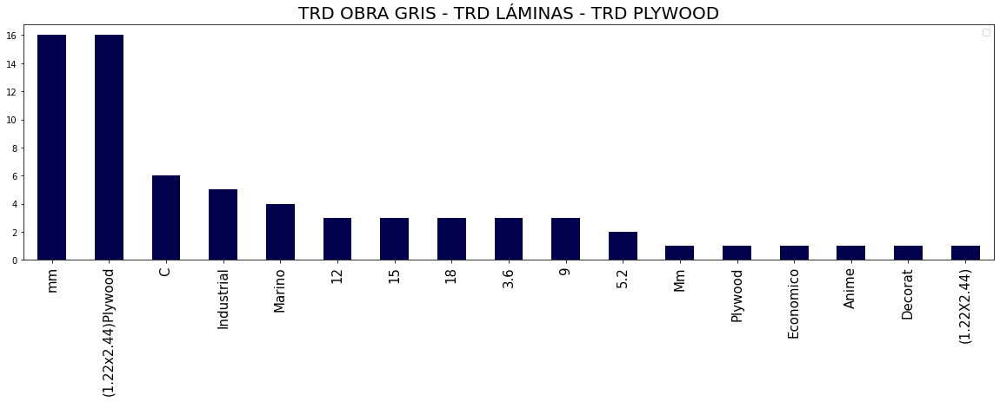

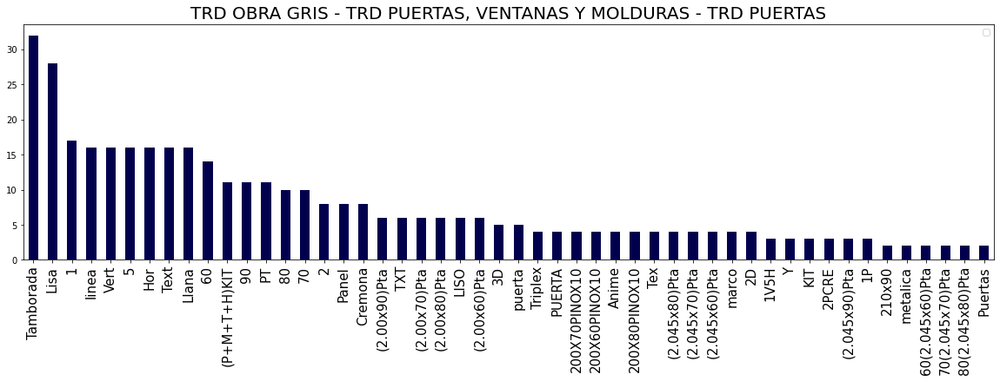

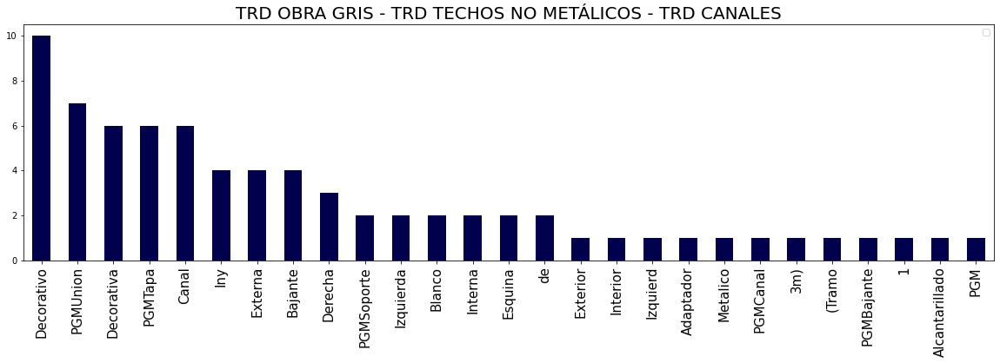

In [24]:
plot_most_common_features(X,df['Final_Category'])

The categories have stopwords in spanish, numbers, symbols and many words with one letter.

For the text processing, we are going to keep just the letters, dropping the words with one letter, the numbers, and the stopwords in spanish.

We are also going to see if stemming the words helps with the performance of the model.

In [25]:
nltk.download('stopwords')

from nltk.stem import SnowballStemmer


def process_text(raw_text):

    letters_only = re.sub("[^a-zA-Z]", " ",raw_text)
    no_one_letter = re.sub(r"\b[a-zA-Z]\b","",letters_only)
    words = no_one_letter.lower().split()
    
    stops = set(stopwords.words("spanish")) 
    not_stop_words = [w for w in words if not w in stops]

    final_words = [word for word in not_stop_words]
    
    return( " ".join( final_words ))  

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ghopk\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
nltk.download('stopwords')

from nltk.stem import SnowballStemmer


def stemming(raw_text):
    
    stemmer = SnowballStemmer('spanish')
    stemmed = [stemmer.stem(word) for word in raw_text]
    
    return("".join(stemmed))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ghopk\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [27]:
X_cleaner = X.apply(lambda x: process_text(x))

In [28]:
X_cleaner_2 = X_cleaner.apply(lambda x: stemming(x))

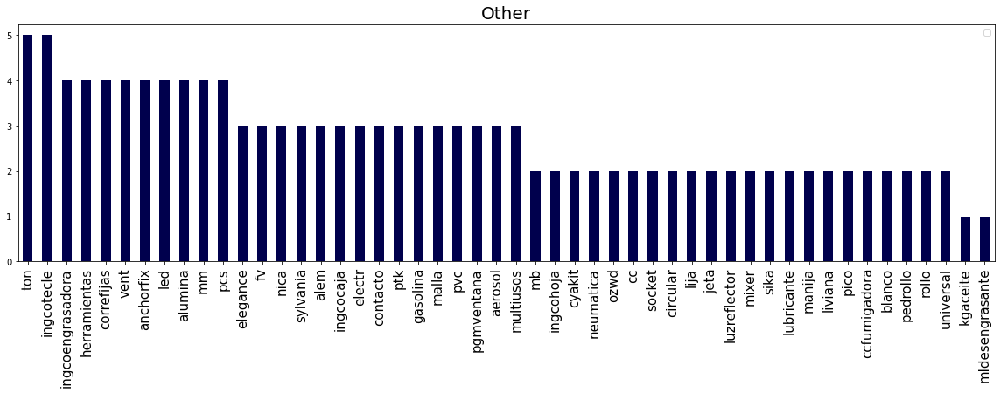

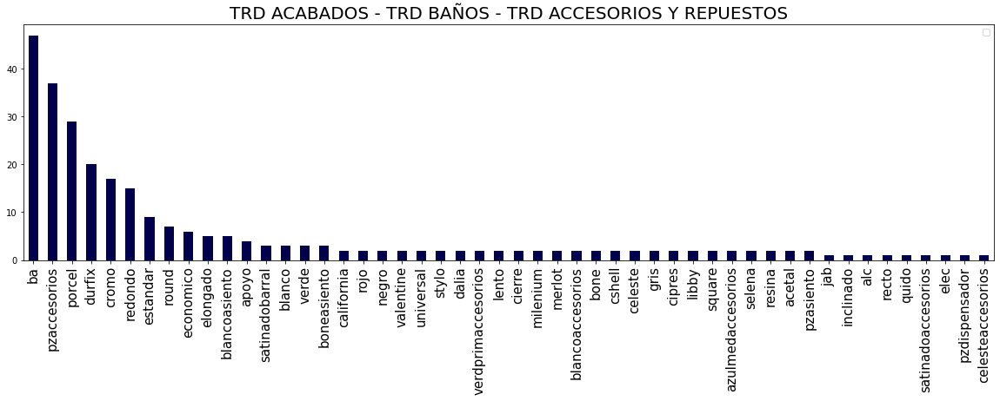

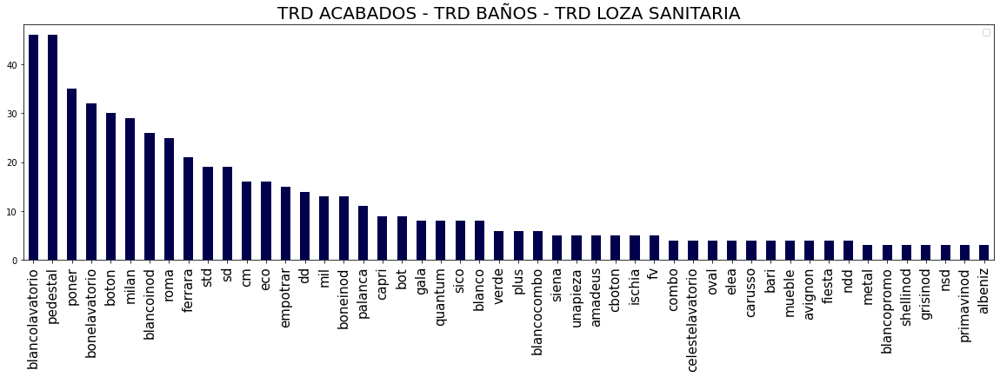

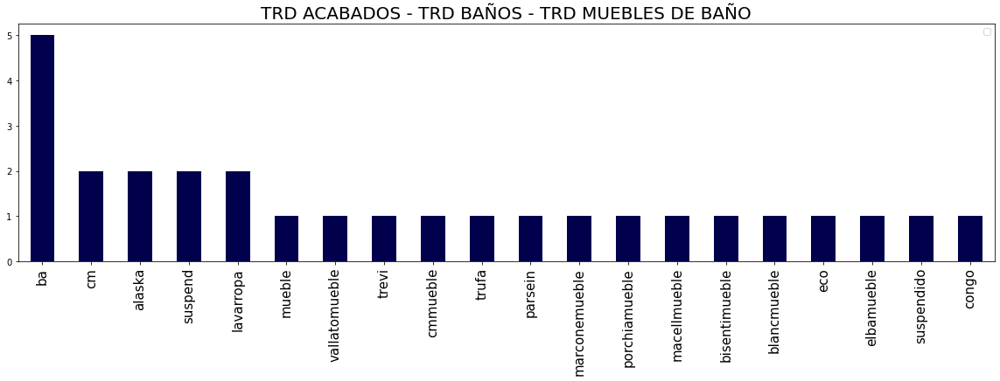

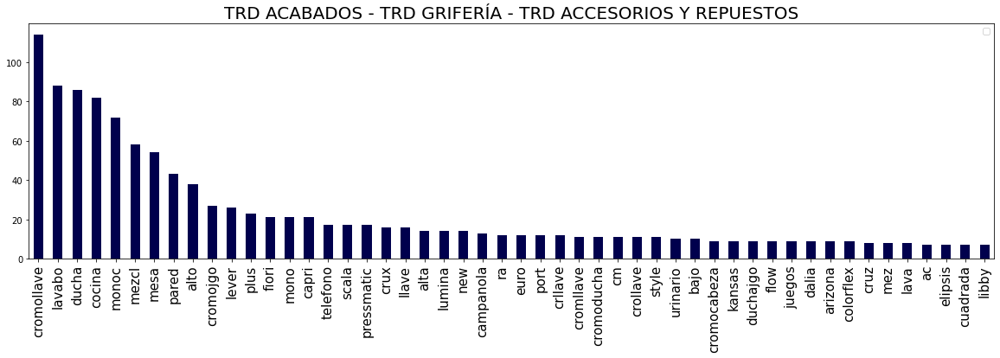

...

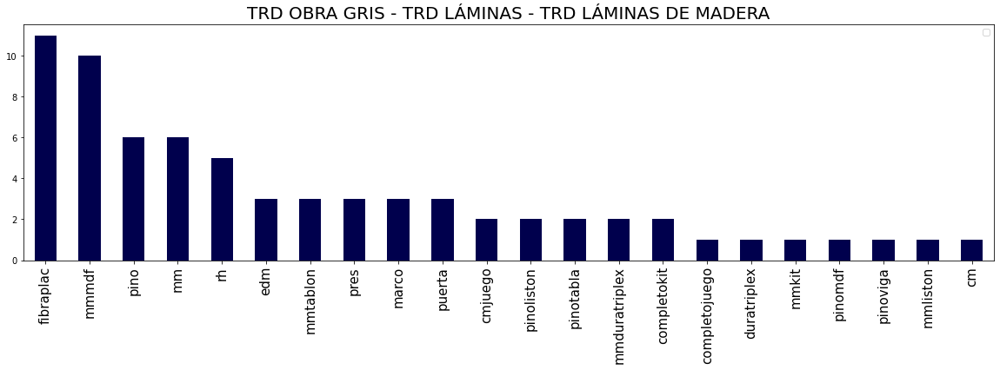

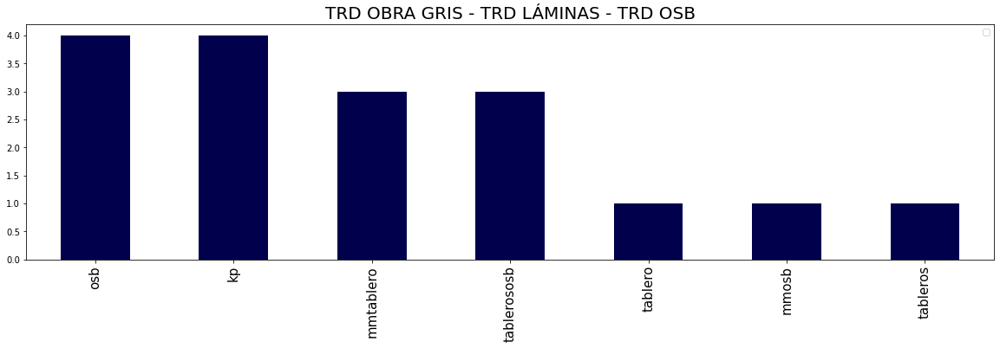

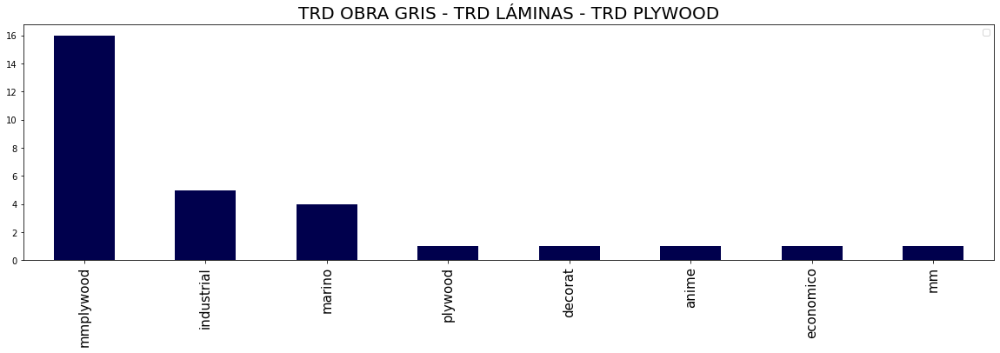

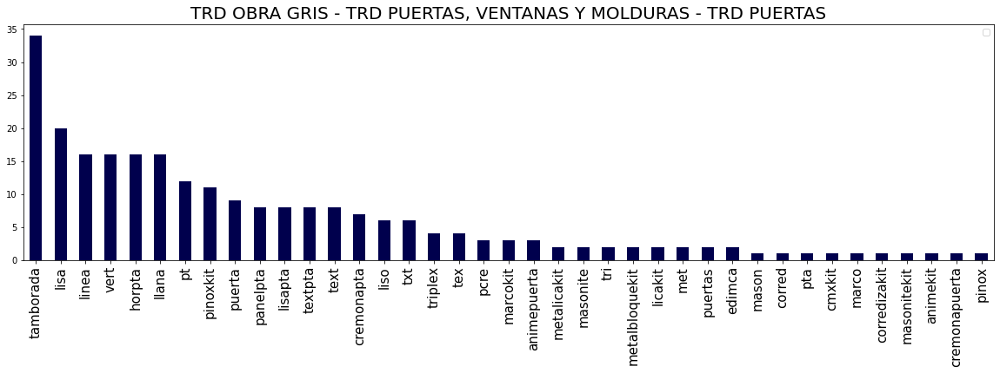

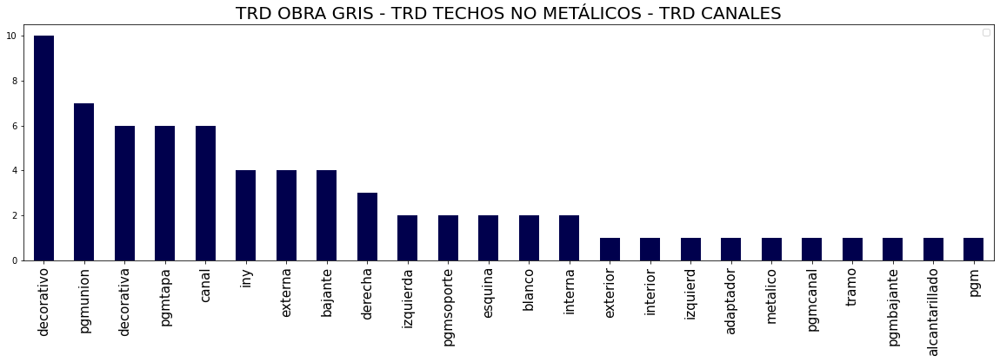

In [29]:
plot_most_common_features(X_cleaner_2,df['Final_Category'])

# 3. Model Training

We are going run a baseline model with Naive Bayes to do the classification.

In [30]:
warnings.filterwarnings('ignore') # Do not print warning messages

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)

In [32]:
def text_p(X):
    return X.apply(lambda x: process_text(x))    

In [33]:
def stemming_func(X):
    return X.apply(lambda x: stemming(x))

In [34]:
count_vect = CountVectorizer(analyzer = "word")
tfidf = TfidfTransformer(norm="l2")

In [35]:
text_process = FunctionTransformer(text_p)
stemming_text = FunctionTransformer(stemming_func)

In [36]:
naive_multi = MultinomialNB()
svc = SVC()
rf = RandomForestClassifier(n_jobs=-1)
lr = LogisticRegression(multi_class='ovr')

In [37]:
pipeline = Pipeline([
    ('process', text_process),
    ('stemmer', stemming_text),
    ('count_vector', count_vect),
    ('tfidf', tfidf),
    ('model', naive_multi)
])
pipeline

Pipeline(steps=[('process',
                 FunctionTransformer(func=<function text_p at 0x0000028809D9FD30>)),
                ('stemmer',
                 FunctionTransformer(func=<function stemming_func at 0x000002880B3B70D0>)),
                ('count_vector', CountVectorizer()),
                ('tfidf', TfidfTransformer()), ('model', MultinomialNB())])

In [38]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('process',
                 FunctionTransformer(func=<function text_p at 0x0000028809D9FD30>)),
                ('stemmer',
                 FunctionTransformer(func=<function stemming_func at 0x000002880B3B70D0>)),
                ('count_vector', CountVectorizer()),
                ('tfidf', TfidfTransformer()), ('model', MultinomialNB())])

In [39]:
matthews_corrcoef(y_train, pipeline.predict(X_train))

0.7988821161384942

In [40]:
recall_score(y_train, pipeline.predict(X_train), average='macro')

0.4086108525249365

The model predicts well in general, but no so much for every class.

## GridSearch

In [41]:
Cs = 10**np.linspace(-1,2,3)
gammas = 10**np.linspace(-2,1,5)

In [42]:
param_grid = [
    {'model': [svc], 'model__kernel': ['linear'], 'model__C': Cs, 'tfidf': [None, tfidf], 'stemmer': [None, stemming_text]},
    {'model': [svc], 'model__kernel': ['rbf'], 'model__gamma': gammas, 'tfidf': [None, tfidf], 'stemmer': [None, stemming_text]},
    {'model': [naive_multi], 'tfidf': [None, tfidf], 'stemmer': [None, stemming_text]},
    {'model': [lr], 'tfidf': [None, tfidf], 'stemmer': [None, stemming_text]},
    {'model': [rf], 'tfidf': [None, tfidf], 'stemmer': [None, stemming_text]}
]

In [43]:
cv = ShuffleSplit(n_splits=5, test_size=0.2)

In [44]:
sklearn.metrics.get_scorer

<function sklearn.metrics._scorer.get_scorer(scoring)>

In [45]:
%%time
gs = GridSearchCV(
    pipeline,
    param_grid = param_grid,
    cv = cv,
    #n_jobs=-1
    scoring='matthews_corrcoef'
)
gs.fit(X_train, y_train)

Wall time: 23min 13s


GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=None, test_size=0.2, train_size=None),
             estimator=Pipeline(steps=[('process',
                                        FunctionTransformer(func=<function text_p at 0x0000028809D9FD30>)),
                                       ('stemmer',
                                        FunctionTransformer(func=<function stemming_func at 0x000002880B3B70D0>)),
                                       ('count_vector', CountVectorizer()),
                                       ('tfidf', TfidfTransformer()),
                                       ('model', Multi...
                         {'model': [LogisticRegression(multi_class='ovr')],
                          'stemmer': [None,
                                      FunctionTransformer(func=<function stemming_func at 0x000002880B3B70D0>)],
                          'tfidf': [None, TfidfTransformer()]},
                         {'model': [RandomForestClassifier(n_jobs=-1)],
                          'stemmer': [None,
                                      FunctionTransformer(func=<function stemming_func at 0x000002880B3B70D0>)],
                          'tfidf': [None, TfidfTransformer()]}],
             scoring='matthews_corrcoef')

# 4. Model Evaluation

In [46]:
gs_results = pd.DataFrame(gs.cv_results_).sort_values(['rank_test_score'])
gs_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model,param_model__C,param_model__kernel,param_stemmer,param_tfidf,param_model__gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
5,2.778675,0.143940,0.762696,0.028885,"SVC(C=3.1622776601683795, kernel='linear')",3.162278,linear,None,TfidfTransformer(),NaN,"{'model': SVC(C=3.1622776601683795, kernel='li...",0.939616,0.946674,0.935806,0.936439,0.944398,0.940587,0.004303,1
7,5.830055,0.799113,1.553066,0.267310,"SVC(C=3.1622776601683795, kernel='linear')",3.162278,linear,FunctionTransformer(func=<function stemming_fu...,TfidfTransformer(),NaN,"{'model': SVC(C=3.1622776601683795, kernel='li...",0.939616,0.946674,0.935806,0.936439,0.944398,0.940587,0.004303,1
9,2.780474,0.151778,0.780777,0.069112,"SVC(C=3.1622776601683795, kernel='linear')",100.0,linear,None,TfidfTransformer(),NaN,"{'model': SVC(C=3.1622776601683795, kernel='li...",0.935643,0.944307,0.935803,0.932466,0.945202,0.938684,0.005105,3
11,5.942411,0.541854,1.670055,0.449898,"SVC(C=3.1622776601683795, kernel='linear')",100.0,linear,FunctionTransformer(func=<function stemming_fu...,TfidfTransformer(),NaN,"{'model': SVC(C=3.1622776601683795, kernel='li...",0.935643,0.944307,0.935803,0.932466,0.945202,0.938684,0.005105,3
4,2.543456,0.089346,0.739759,0.028539,"SVC(C=3.1622776601683795, kernel='linear')",3.162278,linear,None,None,NaN,"{'model': SVC(C=3.1622776601683795, kernel='li...",0.928518,0.943495,0.929480,0.926924,0.942025,0.934088,0.007142,5


In [47]:
gs.best_score_

0.9405868984963683

In [48]:
best_params = gs.best_estimator_.get_params()

In [49]:
pipeline.set_params(**best_params)

Pipeline(steps=[('process',
                 FunctionTransformer(func=<function text_p at 0x0000028809D9FD30>)),
                ('stemmer', None), ('count_vector', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('model', SVC(C=3.1622776601683795, kernel='linear'))])

In [50]:
matthews_corrcoef(y_test, pipeline.predict(X_test))

0.9385410276958717

(array([ 1.,  0.,  1.,  1.,  1.,  9.,  1.,  1., 12., 66.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

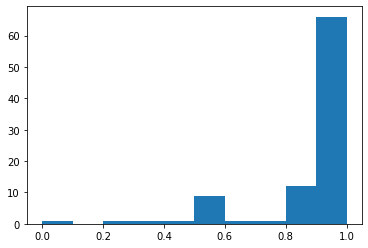

In [51]:
plt.hist(recall_score(y_test, pipeline.predict(X_test), average=None))

(array([0.01075269, 0.01075269, 0.02150538, 0.03225806, 0.04301075,
        0.13978495, 0.15053763, 0.16129032, 0.29032258, 1.        ]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

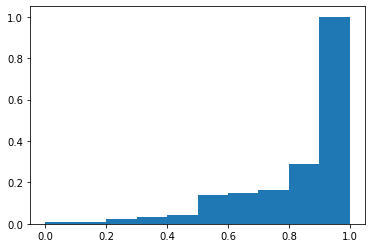

In [52]:
plt.hist(recall_score(y_test, pipeline.predict(X_test), average=None), cumulative=True, density=True)

In [53]:
recall_score(y_test, pipeline.predict(X_test), average='macro')

0.883322363793619

The best model performs better than the baseline model in general, and it performs very well in average for every class.

# 5. Final Prediction

In [115]:
test_set = pd.read_excel('test_set.xlsx')

In [54]:
final_prediction = pd.DataFrame(X_test.copy())

In [119]:
test_set['Prediction'] = pipeline.predict(test_set['Descripción del Producto'])

In [120]:
test_set.head()

,Descripción del Producto,Prediction
0,ARENA,0
1,CEMENTO GRIS HOLCIM,16
2,CEMENTO GRIS HOLCIM,16
3,TELA CRIBA 6X6 ROLLO,19
4,ARENA,0


In [121]:
test_set.replace({'Prediction': code_dictionary}, inplace=True)

In [122]:
test_set.head()

,Descripción del Producto,Prediction
0,ARENA,Other
1,CEMENTO GRIS HOLCIM,TRD ACABADOS - TRD PISOS Y AZULEJOS - TRD PISOS
2,CEMENTO GRIS HOLCIM,TRD ACABADOS - TRD PISOS Y AZULEJOS - TRD PISOS
3,TELA CRIBA 6X6 ROLLO,TRD ESTRUCTURA - TRD ACERO LARGOS - TRD TREFIL...
4,ARENA,Other


In [123]:
test_set = test_set.join(test_set['Prediction'].str.split('-', expand=True).rename(columns={0:'Description N1', 1: 'Description N2', 2: 'Description N3'})).drop(columns='Prediction')

In [124]:
test_set.head()

,Descripción del Producto,Description N1,Description N2,Description N3
0,ARENA,Other,None,None
1,CEMENTO GRIS HOLCIM,TRD ACABADOS,TRD PISOS Y AZULEJOS,TRD PISOS
2,CEMENTO GRIS HOLCIM,TRD ACABADOS,TRD PISOS Y AZULEJOS,TRD PISOS
3,TELA CRIBA 6X6 ROLLO,TRD ESTRUCTURA,TRD ACERO LARGOS,TRD TREFILADOS
4,ARENA,Other,None,None


In [125]:
test_set.to_csv('predictions.csv')

# Saving the model

In [112]:
# save the model to disk
filename = 'category_classifier.sav'
pickle.dump(pipeline, open(filename, 'wb'))